In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


1102.5773195876288 607.7388316151203
1142.5257731958764 615.7353951890034
1126.5463917525774 607.7388316151203
1430.1546391752577 271.88316151202747
1422.1649484536083 271.88316151202747
1406.1855670103093 199.91408934707903
439.4329896907216 511.78006872852234
1150.5154639175257 655.7182130584192
1398.1958762886597 255.89003436426117
503.35051546391753 1039.553264604811
1398.1958762886597 247.89347079037802
1390.2061855670104 255.89003436426117
1150.5154639175257 647.7216494845361
1078.6082474226805 991.5738831615121
966.7525773195877 663.7147766323025


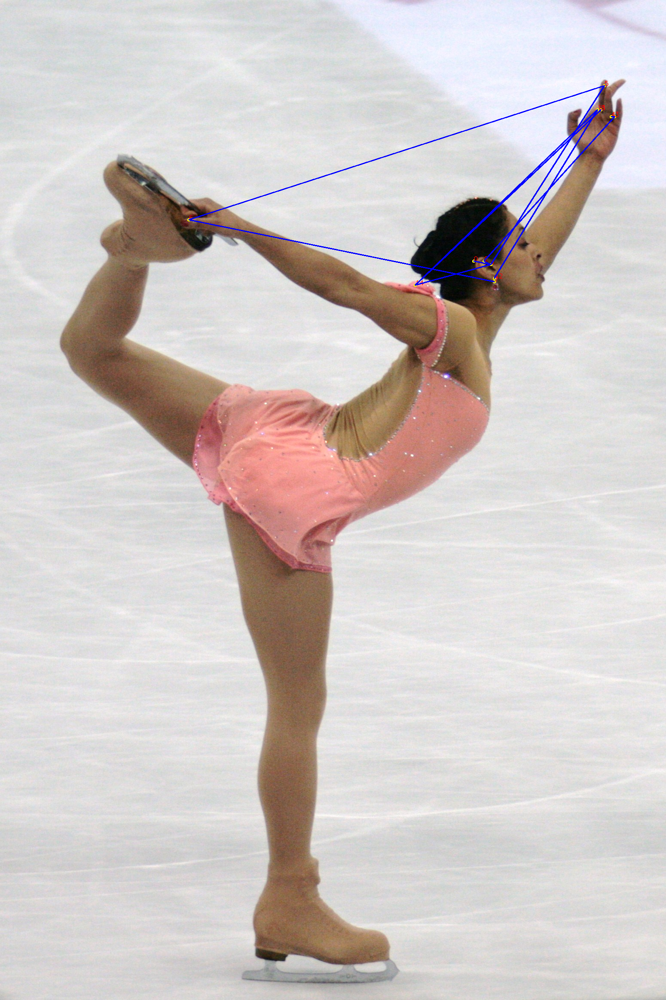

In [ ]:
import os.path as osp
import requests
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

BODY_PARTS = {"Head": 0, "Neck": 1, "RShoulder": 2, "RElbow": 3, "RWrist": 4,
              "LShoulder": 5, "LElbow": 6, "LWrist": 7, "RHip": 8, "RKnee": 9,
              "RAnkle": 10, "LHip": 11, "LKnee": 12, "LAnkle": 13, "Chest": 14,
              "Background": 15}


POSE_PAIRS = [["Head", "Neck"], ["Neck", "RShoulder"], ["RShoulder", "RElbow"],
              ["RElbow", "RWrist"], ["Neck", "LShoulder"], ["LShoulder", "LElbow"],
              ["LElbow", "LWrist"], ["Neck", "Chest"], ["Chest", "RHip"], ["RHip", "RKnee"],
              ["RKnee", "RAnkle"], ["Chest", "LHip"], ["LHip", "LKnee"], ["LKnee", "LAnkle"]]

# setting network
protoFile='/content/drive/MyDrive/인공지능/pose_deploy_linevec_faster_4_stages.prototxt'
weightsFile='/content/drive/MyDrive/인공지능/pose_iter_160000.caffemodel'
net = cv2.dnn.readNetFromCaffe(protoFile, weightsFile)

image = cv2.imread('/content/drive/MyDrive/인공지능/2012_WFSC_03d_119_Ami_Parekh.jpg')
imageHeight, imageWidth, imageColor = image.shape

#이미지 전처리
inpBlob = cv2.dnn.blobFromImage(image, 1.0 / 255, (imageWidth, imageHeight), (0, 0, 0), swapRB=False, crop=False)

net.setInput(inpBlob)

output=net.forward()

H = output.shape[2]
W = output.shape[3]

# points 이미지에 입력
points = []
for i in range(0, 15):
    probMap = output[0, i, :, :]


    #(9.076588321477175e-05, 0.27673089504241943, (17, 11), (10, 12))
    minVal, prob, minLoc, point = cv2.minMaxLoc(probMap)

    # 원래 이미지에 맞게 점 위치 변경
    x = (imageWidth * point[0]) / W
    y = (imageHeight * point[1]) / H

    print(x,y)

    if prob > 0.1:
        cv2.circle(image, (int(x), int(y)), 3, (0, 255, 255), thickness=-1,
                   lineType=cv2.FILLED)  # circle(그릴곳, 원의 중심, 반지름, 색)
        cv2.putText(image, "{}".format(i), (int(x), int(y)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1,
                    lineType=cv2.LINE_AA)
        points.append((int(x), int(y)))
    else:
        points.append(None)

# 관절들 선으로 연결
for pair in POSE_PAIRS:
    partA = pair[0]  # Head
    partA = BODY_PARTS[partA]  # 0
    partB = pair[1]  # Neck
    partB = BODY_PARTS[partB]  # 1

    # print(partA," 와 ", partB, " 연결\n")

    if points[partA] and points[partB]:
        cv2.line(image, points[partA], points[partB], (255, 0, 0), 2)

cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()

1102.5773195876288 607.7388316151203


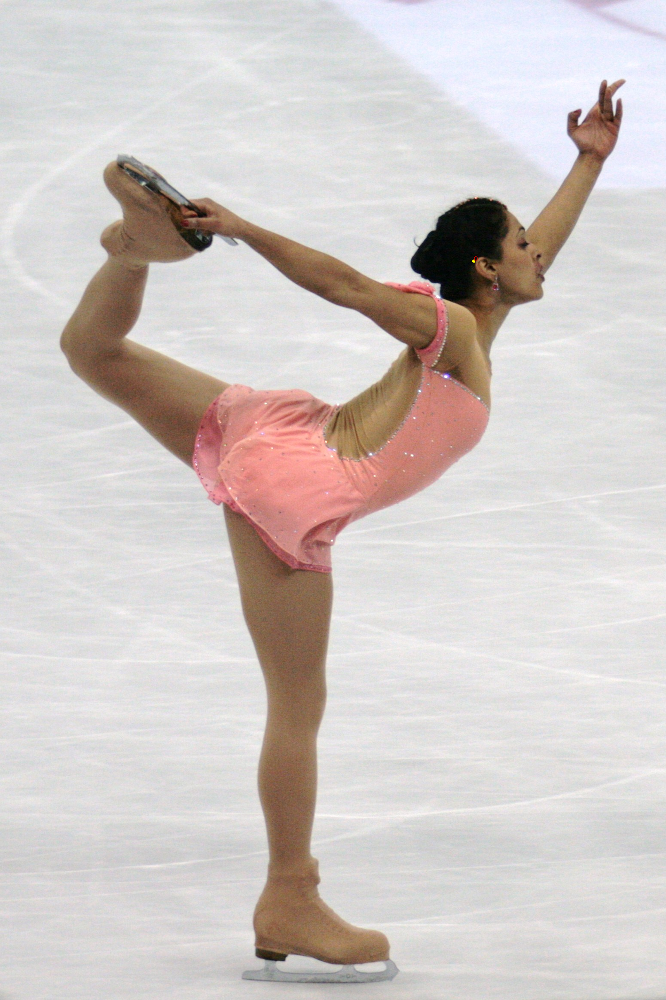

In [ ]:
import os.path as osp
import requests
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# setting network
protoFile='/content/drive/MyDrive/인공지능/pose_deploy_linevec_faster_4_stages.prototxt'
weightsFile='/content/drive/MyDrive/인공지능/pose_iter_160000.caffemodel'
net = cv2.dnn.readNetFromCaffe(protoFile, weightsFile)

image = cv2.imread('/content/drive/MyDrive/인공지능/2012_WFSC_03d_119_Ami_Parekh.jpg')
imageHeight, imageWidth, imageColor = image.shape

#이미지 전처리
inpBlob = cv2.dnn.blobFromImage(image, 1.0 / 255, (imageWidth, imageHeight), (0, 0, 0), swapRB=False, crop=False)

net.setInput(inpBlob)

output=net.forward()

H = output.shape[2]
W = output.shape[3]

Head = 0

points = []

probMap = output[0, 0, :, :]

minVal, prob, minLoc, point = cv2.minMaxLoc(probMap)

# 원래 이미지에 맞게 점 위치 변경
x = (imageWidth * point[0]) / W
y = (imageHeight * point[1]) / H

print(x,y)

if prob > 0.1:
  cv2.circle(image, (int(x), int(y)), 3, (0, 255, 255), thickness=-1,
  lineType=cv2.FILLED)  # circle(그릴곳, 원의 중심, 반지름, 색)
  cv2.putText(image, "{}".format(0), (int(x), int(y)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1,
                    lineType=cv2.LINE_AA)
  points.append((int(x), int(y)))
else:
  points.append(None)


cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()


In [ ]:
protoFile

'/content/drive/MyDrive/인공지능/pose_deploy_linevec_faster_4_stages.prototxt'

# import

In [ ]:
import numpy as np
import pandas as pd

from tensorflow import keras

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation, Conv2D, MaxPooling2D, Dense, Flatten
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.utils import to_categorical
from keras.callbacks import ModelCheckpoint

from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

In [ ]:
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input

VGG_model = VGG16(weights='imagenet', include_top=False)

img_path = '/content/drive/MyDrive/yuna.jpeg'
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
print(x.shape) #3차원데이터인지 확인함
x = preprocess_input(x)
features = VGG_model.predict(x)

print(features.shape)

(1, 224, 224, 3)
1/1 [==============================] - 0s 140ms/step
(1, 7, 7, 512)


In [ ]:
filter_size = 3
pool_size = 2

CNN_model = Sequential([
  keras.Input(shape=(7,7,512)),

#1layer
  Conv2D(filters = 50, kernel_size = (3,3), padding='same'),
  BatchNormalization(),
  Activation('relu'),
  Conv2D(filters = 50, kernel_size = (3,3), padding='same'),
  BatchNormalization(),
  Activation('relu'),
  MaxPooling2D(pool_size=pool_size),

#2layer
  Conv2D(filters = 50, kernel_size = (3,3), padding='same'),
  BatchNormalization(),
  Activation('relu'),
  Conv2D(filters = 50, kernel_size = filter_size, padding='same'),
  BatchNormalization(),
  Activation('relu'),
  MaxPooling2D(pool_size=pool_size),

  Flatten(),
  Dense(50),
  Activation('relu'),

  Dense(10),
  Activation('relu'),

  Dense(2),

])

CNN_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_110 (Conv2D)         (None, 7, 7, 50)          230450    
                                                                 
 batch_normalization_110 (Ba  (None, 7, 7, 50)         200       
 tchNormalization)                                               
                                                                 
 activation_117 (Activation)  (None, 7, 7, 50)         0         
                                                                 
 conv2d_111 (Conv2D)         (None, 7, 7, 50)          22550     
                                                                 
 batch_normalization_111 (Ba  (None, 7, 7, 50)         200       
 tchNormalization)                                               
                                                                 
 activation_118 (Activation)  (None, 7, 7, 50)        

In [ ]:
checkpoint_filepath = "/content/drive/MyDrive/데기인팀플/checkpoint"
model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1)

CNN_model.compile(
  'adam',
  loss='mse', #회귀, losee=mse
  metrics=['accuracy'],
)

k= CNN_model.predict(features, verbose=0)
k=k[0]
x, y=k